In [1]:
#importing necessary library
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

In [2]:
#reading csv file test and train,and storing them both in df using concat 
# using double slash because of unicode error
train=pd.read_csv("C:\\Users\\JOHN TOJO\\Desktop\\Project-Housing--2---1---1-\\train.csv")
test=pd.read_csv("C:\\Users\\JOHN TOJO\\Desktop\\Project-Housing--2---1---1-\\test.csv")
train["source"]="train"
test["source"]="test"
df=pd.concat([train,test],ignore_index=True)
df.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,source
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,2,2007,WD,Normal,128000.0,train
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,10,2007,WD,Normal,268000.0,train
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,6,2007,WD,Normal,269790.0,train
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000.0,train
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,NaN,0,6,2009,WD,Normal,215000.0,train


In [3]:
#To see all columns and rows
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

#### checking data types

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

- 44 object and 34 int datatypes

#### checking nulls

In [5]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

- nulls are present in the dataset 
- imputation needed for 
    - 'LotFrontage', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',    'Electrical','FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond', 'SalePrice'

In [6]:
# searching for columns where more than 80% data is nulls 
pos=np.where(df.isna().sum()>=1168)
df.columns[pos]

Index(['Alley', 'PoolQC', 'Fence', 'MiscFeature'], dtype='object')

In [7]:
# dropping those columns which have more than 80% nulls
df.drop(['Alley', 'PoolQC', 'Fence', 'MiscFeature'],axis=1,inplace=True)
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,source
0,127,120,RL,NaN,4928,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,0,2,2007,WD,Normal,128000.0,train
1,889,20,RL,95.0,15865,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,0,10,2007,WD,Normal,268000.0,train
2,793,60,RL,92.0,9920,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,0,6,2007,WD,Normal,269790.0,train
3,110,20,RL,105.0,11751,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,0,1,2010,COD,Normal,190000.0,train
4,422,20,RL,NaN,16635,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,0,6,2009,WD,Normal,215000.0,train
5,1197,60,RL,58.0,14054,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,0,11,2006,New,Partial,219210.0,train
6,561,20,RL,NaN,11341,Pave,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,0,5,2010,WD,Normal,121500.0,train
7,1041,20,RL,88.0,13125,Pave,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,0,1,2006,WD,Normal,155000.0,train
8,503,20,RL,70.0,9170,Pave,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,400,4,2007,WD,Normal,140000.0,train
9,576,50,RL,80.0,8480,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,GasA,TA,Y,SBrkr,832,384,0,1216,0,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1947.0,Unf,1,336,TA,TA,Y,158,0,102,0,0,0,0,10

In [8]:
df.shape

(1460, 78)

#### Checking for unique values in each columns


In [9]:
df.nunique()

Id               1460
MSSubClass         15
MSZoning            5
LotFrontage       110
LotArea          1073
Street              2
LotShape            4
LandContour         4
Utilities           2
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         112
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        15
Exterior2nd        16
MasVnrType          4
MasVnrArea        327
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        637
BsmtFinType2        6
BsmtFinSF2        144
BsmtUnfSF         780
TotalBsmtSF       721
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          753
2ndFlrSF          417
LowQualFinSF       24
GrLivArea 

- Id has all values unique dropping


In [10]:
df.drop(["Id"],axis=1,inplace=True)

In [11]:
df.shape

(1460, 77)

#### checking the frequency of zero present in each column

In [12]:
Zero_count = pd.DataFrame(df.isin([0]).sum().sort_values(ascending=False))
Zero_count.columns=['frequency of zero']
Zero_count['% ']=Zero_count['frequency of zero']/1460
Zero_count


,frequency of zero,%
PoolArea,1453,0.995205
3SsnPorch,1436,0.983562
LowQualFinSF,1434,0.982192
MiscVal,1408,0.964384
BsmtHalfBath,1378,0.943836
ScreenPorch,1344,0.920548
BsmtFinSF2,1293,0.885616
EnclosedPorch,1252,0.857534
HalfBath,913,0.625342
MasVnrArea,861,0.589726


#### check for duplicates

In [13]:
df.duplicated().sum()

0

no duplicates exists

#### seperating numerical and categorical data type

In [14]:
numericalCol=df.select_dtypes(include=np.number).columns
print("The numerical columns are:",numericalCol)
print('\n')
objectColumns=df.select_dtypes(include=np.object).columns
print("The categorical columns are:",objectColumns)

The numerical columns are: Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')


The categorical columns are: Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFin

#### diving numerical columns into two categories discrete and continuous

In [15]:
discretecols=[]
continuecols=[]

for column in numericalCol:
     if df[column].nunique()>10:
        continuecols.append(column)
     
     else:
        discretecols.append(column)
        
print("The discrete columns are:",discretecols)
print('\n')
print("The continuous columns are:",continuecols) 

The discrete columns are: ['OverallQual', 'OverallCond', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'Fireplaces', 'GarageCars', 'PoolArea', 'YrSold']


The continuous columns are: ['MSSubClass', 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'TotRmsAbvGrd', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'MiscVal', 'MoSold', 'SalePrice']


#### Imputation

In [16]:
df.isna().sum().sum()

1850

- for numerical data types imputing by mean

In [17]:
for i in range(0,len(numericalCol)):
    df[numericalCol[i]].fillna(df[numericalCol[i]].mean(), inplace=True)

- for categorical datas imputing by mode

In [18]:
for i in range(0,len(objectColumns)):
    df[objectColumns[i]].fillna(df[objectColumns[i]].mode()[0], inplace=True)

In [19]:
#check
df.isna().sum().sum()

0

#### checking how the data is defined statistically for numerical continuous datas and visualising

In [20]:
df[continuecols].describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.000000,70.00,190.0
LotFrontage,1460.0,70.049958,22.024023,21.0,60.00,70.049958,79.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.500000,11601.50,215245.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.000000,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.000000,2004.00,2010.0
MasVnrArea,1460.0,103.685262,180.569112,0.0,0.00,0.000000,164.25,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.500000,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.000000,0.00,1474.0
BsmtUnfSF,1460.0,567.240411,441.866955,0.0,223.00,477.500000,808.00,2336.0
TotalBsmtSF,1460.0,1057.429452,438.705324,0.0,795.75,991.500000,1298.25,6110.0


- MSSubClass
    - mean to std ratio is 1.3
    - the difference between each quantile is not uniform
    
    
- LotFrontage 
    - mean to std ratio is 3.1
    - the difference between each quantile is uniform, but difference between 25% and min, and max and 75% is not uniform
    - most of the people would like to have it around 70 feet
    

- LotArea
    - mean to std ratio is 1.05
    - the difference between each quantile is not uniform
    - the lot area prefered is 1000 sqr feet
    
- YearBuilt 
    - the houses considered were bulit from 1872 to 2010
    
 
- YearRemodAdd
    - few houses were remodeled, houses were remodeled from 1984 to 2010
    
    
-  MasVnrArea 
    - mean to std ratio is 0.57
    - min value is 0 to 1600 sqft
    - it has value 0 which is acceptable because some have not opted for MasVnrType as none
    - the difference between each quantile is not uniform
    
    
- BsmtFinSF1
    - mean to std ratio is 0.97
    - ranges from 0 to 5644
    - has value 0 for those where BsmtFinType1 is Unf
    - the difference between each quantile is not uniform
    
    
- BsmtFinSF2
    - mean to std ratio is 0.28
    - ranges from 0 to 1474
    - has value 0 for those where BsmtFinType2 is Unf
    - the difference between each quantile is not uniform   
    
    
- BsmtUnfSF  
    - mean to std ratio is 1.28
    - ranges from 0 to 2336
    - has value 0 for those where there is no unfinieshed basement area
    - the difference between each quantile is not uniform  
    
    
- TotalBsmtSF
    - mean to std ratio is 2.4
    - ranges from 0 to 6110
    - has value 0 for those where BsmtFinType1 and BsmtFinType2 is unf and BsmtFinSF1 and BsmtFinSF2 has values 0
    - the difference between each quantile is not uniform      
    
 
- 1stFlrSF
    - mean to std ratio is 1.15
    - ranges from 334 to 4692
    - the difference between each quantile is not uniform  
    
    
- 2ndFlrSF
    - mean to std ratio is 0.79
    - ranges from 0 to 2065
    - has value 0 for those where HouseStyle is 1Story, SFoyer, 1.5Unf, 1.5Fin, SLvl and BldgType are TwnhsE, 1Fam,2fmCon, Duplex, Twnhs  
    - the difference between each quantile is not uniform 
    
    
- LowQualFinSF
    - mean to std ratio is 0.119
    - ranges from 0 to 572
    - the difference between each quantile is not uniform  
        
        
- GrLivArea
    - mean to std ratio is 2.85
    - ranges from 334 to 5642
    - the difference between each quantile is not uniform 
    
    
- TotRmsAbvGrd   
    - mean to std ratio is 4.06
    - ranges from 2 to 16
    - the difference between each quantile is not uniform 
    
    
- GarageYrBlt   
    - houses have garages used from 1900-2010
 

- GarageArea   
    - mean to std ratio is 2.21
    - ranges from 0 to 1418
    - the difference between each quantile is not uniform 
    
    
- WoodDeckSF
    - mean to std ratio is 0.75
    - ranges from 0 to 875
    - the difference between each quantile is not uniform 
    
    
- OpenPorchSF
    - mean to std ratio is 0.7
    - ranges from 0 to 547
    - the difference between each quantile is not uniform 
    
    
- EnclosedPorch
    - mean to std ratio is 0.35
    - ranges from 0 to 552
    - the difference between each quantile is not uniform 
        
    
- 3SsnPorch
    - mean to std ratio is 0.116
    - ranges from 0 to 508
    - the difference between each quantile is not uniform 
            
    
- ScreenPorch
    - mean to std ratio is 0.26
    - ranges from 0 to 480
    - the difference between each quantile is not uniform 
    
    
- MiscVal
    - mean to std ratio is 0.087
    - ranges from 0 to 15500
    - the difference between each quantile is not uniform  
    
    
- MoSold
    - mean to std ratio is 2.3
    - ranges from 1 to 12
    - the difference between each quantile is not uniform      
    

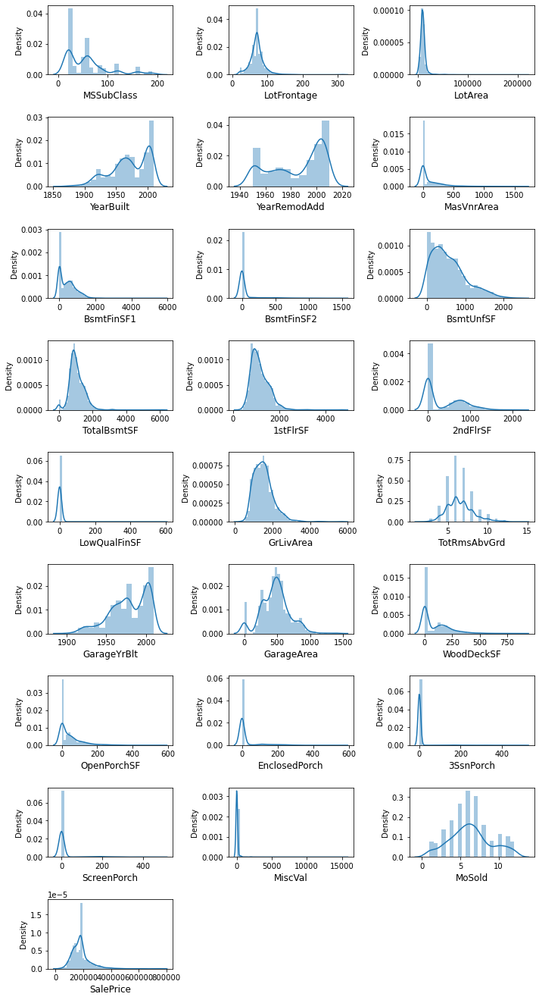

In [21]:
# plotting distribution graph 
j=0
plt.figure(figsize=(10,20))
for column in df[continuecols]:
    plt.subplot(10,3,j+1)
    sns.distplot(df[column])
    plt.xlabel(column,fontsize=12)
    j+=1
plt.tight_layout()

- MSSubClass
    - not uniformly distributed
    - skewed positively
    - presence of outliers
    
    
- LotFrontage
    - appears to be uniformly distributed
    - skewed positively
    
    
- LotArea
    - appears to be uniformly distributed
    
    
- YearBuilt
    - not uniformly distributed
    - negatively skewed    


- YearRemodAdd
    - not uniformly distributed
    - negatively skewed


- MasVnrArea
    - not uniformly distributed
    - has high concentration of data at 0 
    - skewed positively


- BsmtFinSF1
    - not uniformly distributed
    - has high concentration of data at 0
    - skewed positively  


- BsmtFinSF2
    - not uniformly distributed
    - has high concentration of data at 0


- BsmtUnfSF
    - not uniformly distributed 
    - skewed positively
    - presence of outliers


- TotalBsmtSF
    - not uniformly distributed
    - skewed positively
    - presence of outliers
    - more than one mode


- 1stFlrSF
    - not uniformly distributed
    - skewed positively
    - presence of outliers


- 2ndFlrSF
    - not uniformly distributed
    - presence of outliers
    - more than one mode


- GrLivArea
    - not uniformly distributed
    - skewed positively
    - presence of outliers


- TotRmsAbvGrd
    - not uniformly distributed


- GarageYrBlt
    - not uniformly distributed
    - skewed negitively
    - presence of outliers


- GarageArea
    - not uniformly distributed
    - presence of outliers
    - more than one mode


- WoodDeckSF
    - not uniformly distributed
    - skewed positively
    - presence of outliers


- OpenPorchSF
    - not uniformly distributed
    - skewed positively
    - presence of outliers


- MoSold
    - not uniformly distributed
    - skewed negatively
    - presence of outliers

#### checking how the data is defined statistically for numerical discrete datas and visualising

In [22]:
df[discretecols].describe().T

,count,mean,std,min,25%,50%,75%,max
OverallQual,1460.0,6.099315,1.382997,1.0,5.0,6.0,7.0,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.0,5.0,6.0,9.0
BsmtFullBath,1460.0,0.425342,0.518911,0.0,0.0,0.0,1.0,3.0
BsmtHalfBath,1460.0,0.057534,0.238753,0.0,0.0,0.0,0.0,2.0
FullBath,1460.0,1.565068,0.550916,0.0,1.0,2.0,2.0,3.0
HalfBath,1460.0,0.382877,0.502885,0.0,0.0,0.0,1.0,2.0
BedroomAbvGr,1460.0,2.866438,0.815778,0.0,2.0,3.0,3.0,8.0
KitchenAbvGr,1460.0,1.046575,0.220338,0.0,1.0,1.0,1.0,3.0
Fireplaces,1460.0,0.613014,0.644666,0.0,0.0,1.0,1.0,3.0
GarageCars,1460.0,1.767123,0.747315,0.0,1.0,2.0,2.0,4.0


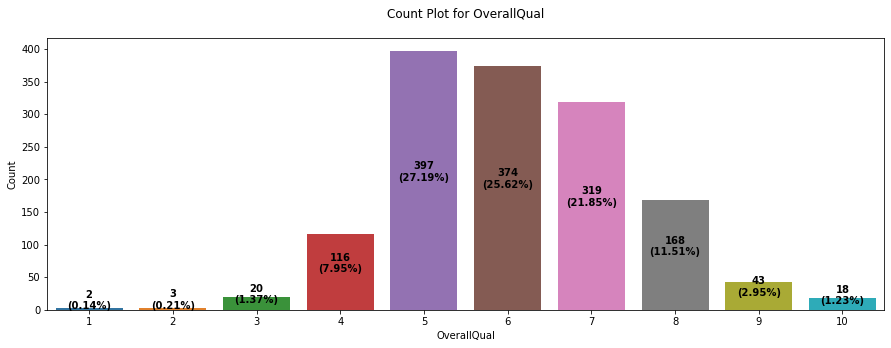

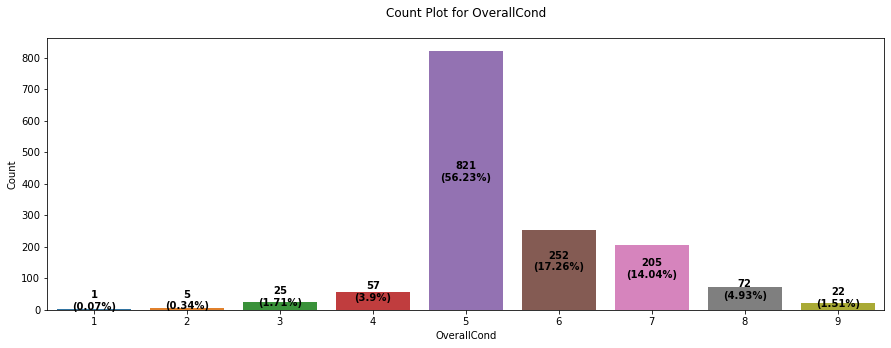

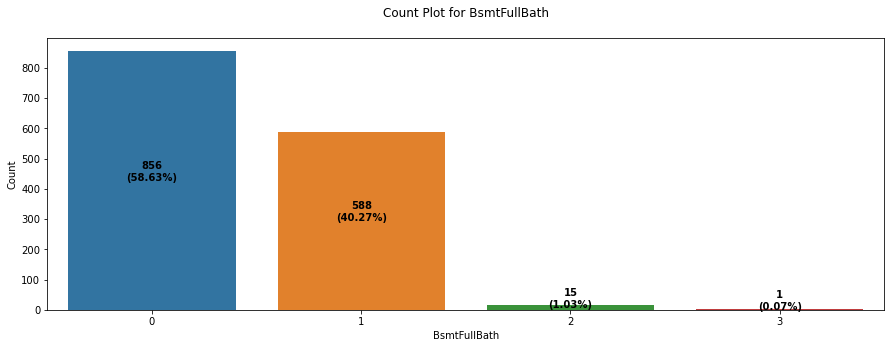

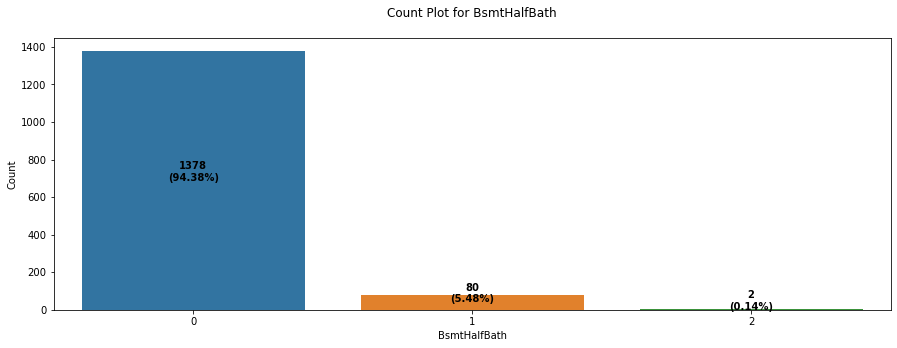

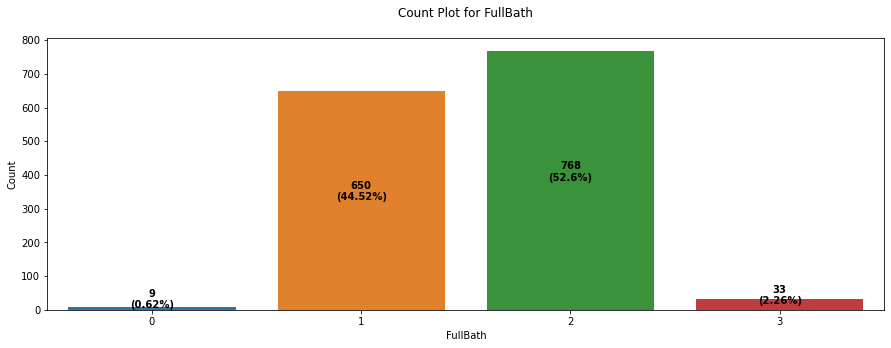

...

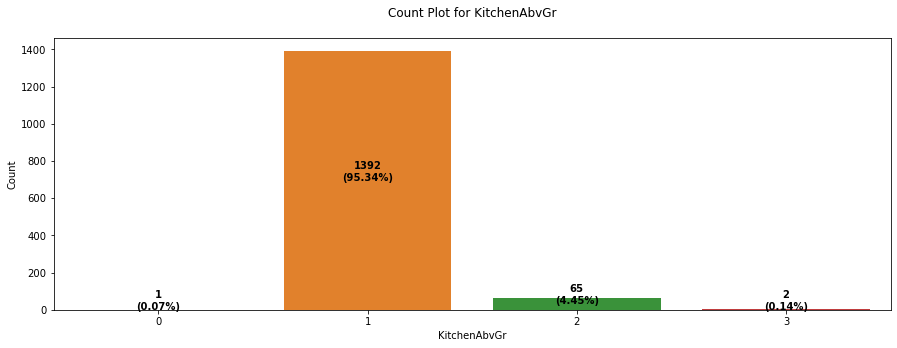

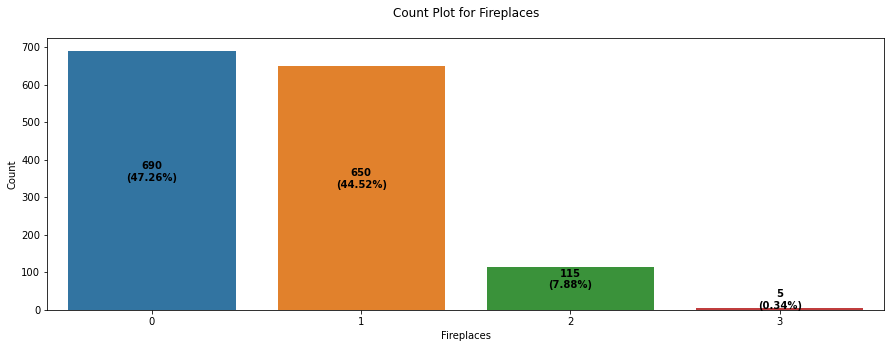

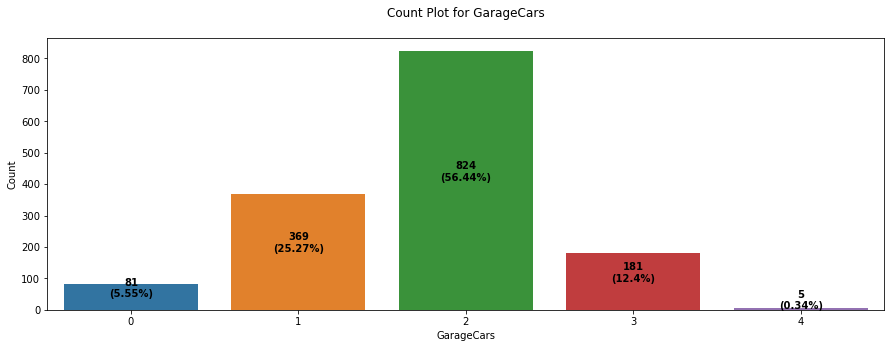

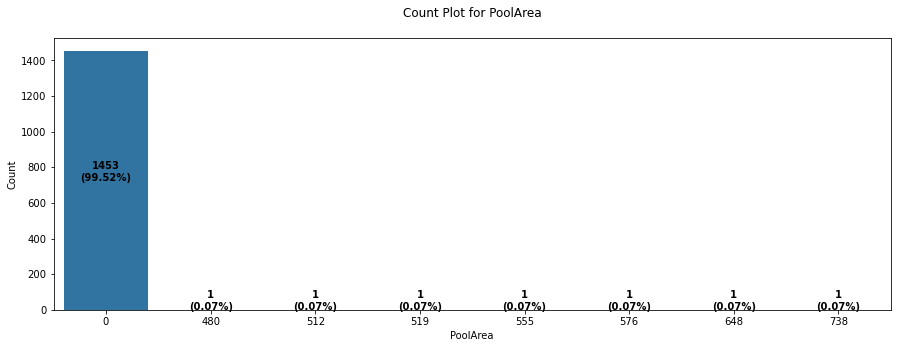

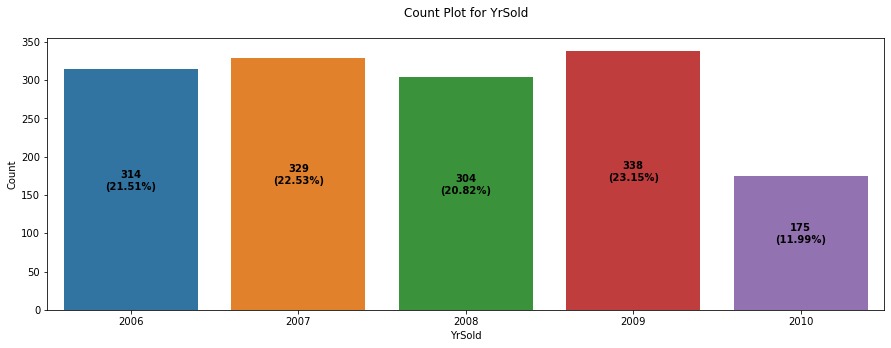

In [23]:
 #listing all Categorical data and plotting 
for x in discretecols:
    plt.figure(figsize=(15,5))
    col_name = x
    values = df[x].value_counts()
    index = 0
    ax = sns.countplot(df[x])

    for i in ax.patches:
        h = i.get_height() #Count of each value
        t = len(df[col_name]) # Total no of records using length
        s = f"{h}\n({round(h*100/t,2)}%)" #Displaying in count bar
        plt.text(index, h/2, s, ha="center", fontweight="bold")
        index += 1
    
    plt.title(f"Count Plot for {x}\n")
    plt.xlabel(x)
    plt.ylabel(f"Count")
    plt.show()

- OverallQual
    - the avg quality of the houses is around 6 
    - most of the houses have rating 5,6 and 7	
    - some houses have been given rating 1 and few rating 10
    - the houses quality needs to be improved
    
    
- OverallCond  
    - the avg condition of house is 5.5
    - max ratng given is 9 and minimum is 1
    - the condition of the house needs to be improved
    
 
- BsmtFullBath
    - most of the houses doesnt have basement full bath
    - very few houses have 1 basement full bath
    
    
- BsmtHalfBath
    - most of the houses doesnt have basement half bath
    
    
- FullBath
    - most of the houses have 2 Full bathrooms above grade, followed by 1
    
    
- HalfBath
    - most of the houses have 0 Full bathrooms above grade
    
    
- BedroomAbvGr
    - most of the houses atleast 3 bedroom above grade, followed by 2 and 4 bedrooms above grade
    
    
- KitchenAbvGr
    - most of the houses atleast 1 kitchen above grade
    
    
-  Fireplaces  
    - most of houses doesn thave fireplace
    - few houses have 1 fireplace
    
    
-  GarageCars
    - most of the houses have space for 2 cars 
    

 - PoolArea
    - most of the houses doesnt have a pool areas


- YrSold
    - the houses considered were sold from 2007 to 2010

#### checking how the data is defined statistically for categorical datas`and visualising

In [24]:
df[objectColumns].describe(include=['O'])

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition,source
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,5,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,9,6,2
top,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal,train
freq,1151,1454,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,872,906,1282,647,686,1348,991,467,1294,1428,741,1365,1335,735,1360,1070,951,686,1392,1407,1340,1267,1198,1168


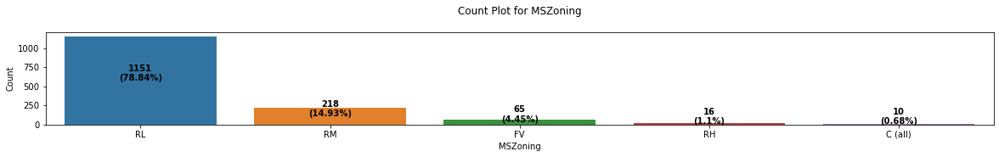

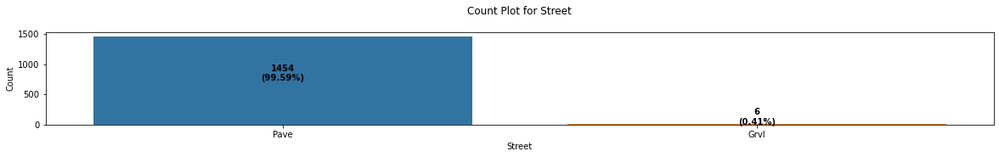

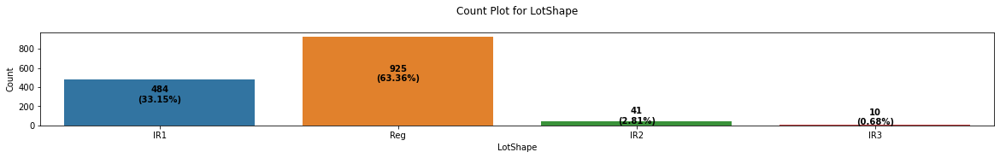

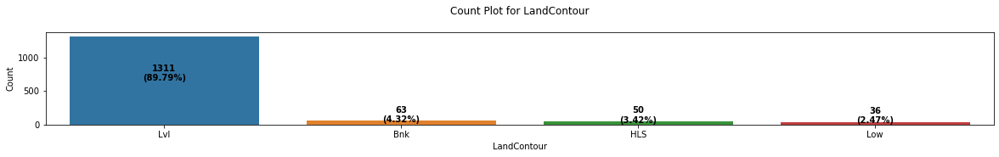

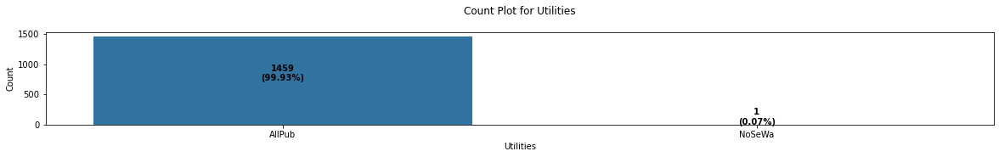

...

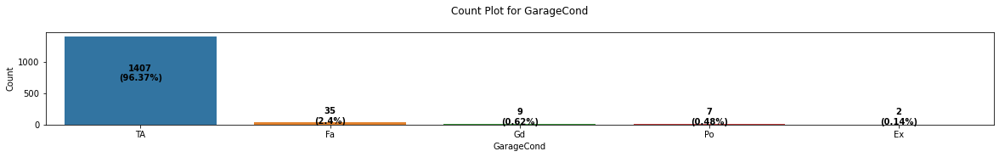

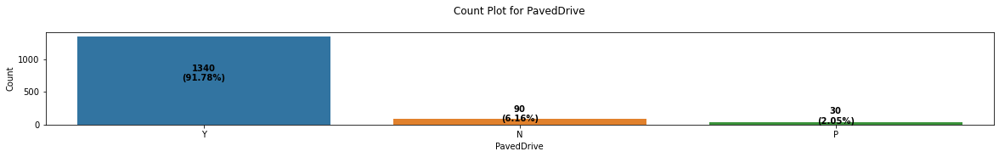

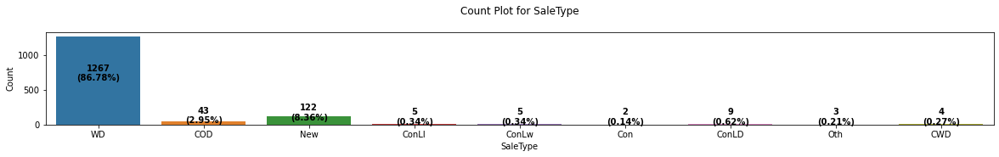

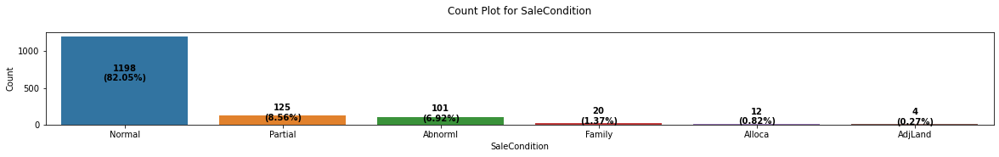

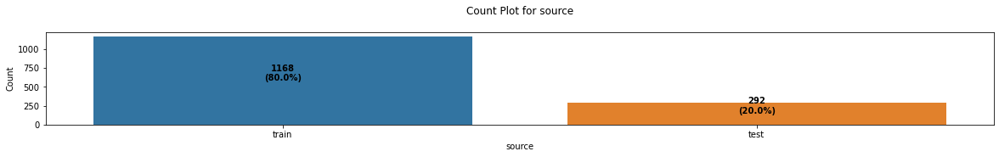

In [25]:
 #listing all Categorical data and plotting 
for x in objectColumns:
    plt.figure(figsize=(20,2))
    col_name = x
    values = df[x].value_counts()
    index = 0
    ax = sns.countplot(df[x])

    for i in ax.patches:
        h = i.get_height() #Count of each value
        t = len(df[col_name]) # Total no of records using length
        s = f"{h}\n({round(h*100/t,2)}%)" #Displaying in count bar
        plt.text(index, h/2, s, ha="center", fontweight="bold")
        index += 1
    
    plt.title(f"Count Plot for {x}\n")
    plt.xlabel(x)
    plt.ylabel(f"Count")
    plt.show()

- RL is the most prefered, followed by RM as MSZoning

- most of the people like the street to be Paved

- Regular is the most prefered lot shape

- most of the people prefered level or near flat as their land contour

- most of the residents require all public utilities available

- residents prefer gentle slope  for their land 

- most of the residents who took part in the survey were from NAmes folowed by CollgCr

- most of the residents prefer condition 1 and condition 2 as normal

- most of the resdents prefered 1Fam as their building type

- most of the residents prefer single story building

- most of the residents prefer Gable as their roof style and prefer to have the roof material as Standard (Composite) Shingle

- residents prefer to have the exterior 1 and 2 with Vinyl Siding and have rated the condtion and quality of the exterior as average

- residents dont prefer to have any masonry vaneer

- residents prefer to have the Foundation using CBlock

- residents prefer their BsmtQual as TA ie within 80-89 inches, and wants their basement condition as typical with some dampness allowed, with no allowance for their basement

- most of the houses considered had their BsmtFinType 1 and 2 as unfinished

- the houses used GasA as their heating sources with central air conditioning, and have given excellent rating

- most of the houses had Standard Circuit Breakers & Romex as their electric systems

- KitchenQual was given as average

- residents prefer their houses to have typical functionality

- residents have given rating as good for quality of fireplace provided

- the garage type prefered is attached with interior finish as unfinished, the quality of the garage and the condition of garage is average

- residents prefer their driveway as paved

- residents sale type was Warranty Deed - Conventional and sales condition was normal
 


#### Bivariate analysis

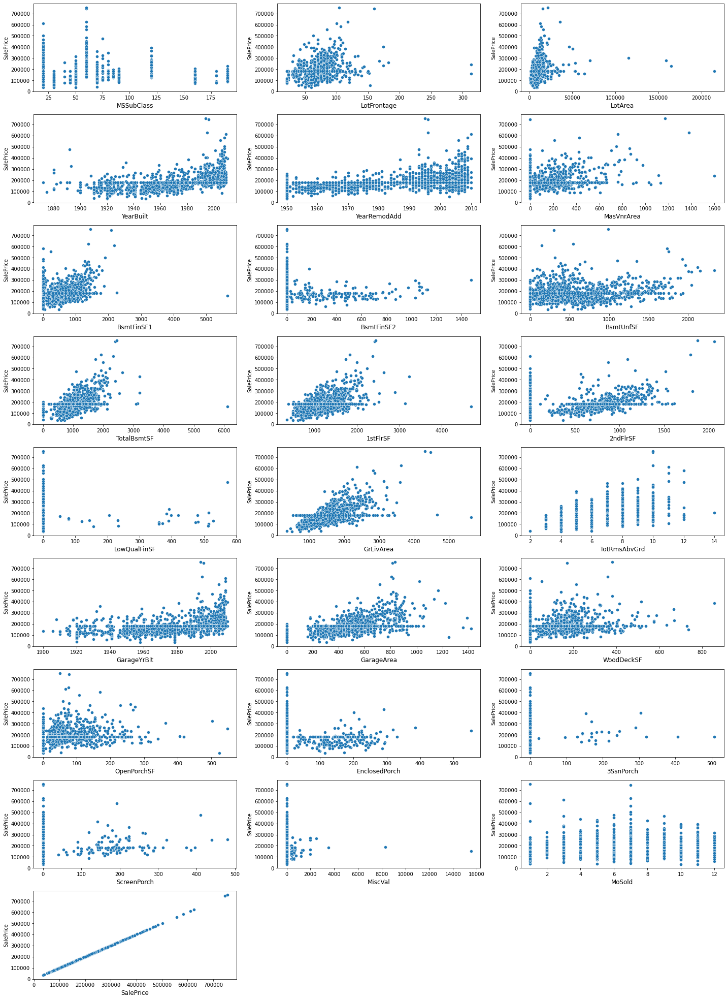

In [26]:
j=0

plt.figure(figsize=(20,30))
for column in df[continuecols]:
    plt.subplot(10,3,j+1)
    sns.scatterplot(data=df,x=column, y="SalePrice")
    plt.xlabel(column,fontsize=12)
    j+=1
plt.tight_layout()

- MSSubClass	
	- 2-STORY 1946 & NEWER (20) and 1-STORY 1946 & NEWER ALL STYLES (60) are having higher sale Price


- LotFrontage & LotArea
	- as the area increases the sale price increases


- YearBuilt
	- those houses bulit from 1900 to 1990 have the same sale price  
	- sale price is high for houses built from  1991-2010


- YearRemodAdd
	- houses remodelled from 1950-1990 have the same price and linear price increase can be seen from 1991-2010


- MasVnrArea
	- as the area increase sale prices increases


- BsmtFinSF1
	- as the area increases price increases


- BsmtFinSF2 and BsmtuNFsf
	- the price remains almost a constant


- TotalBsmtSF
	- as the area increases price increases


- 1stFlrSF and 2ndFlrSF
	- as the area increases price increase


- LowQualFinSf
	- most of the houses had 0 and it sales price was around 500000


- GrLivArea
	- as area increases price increases


- TotRmsAbvGrd
	- most of the houses had 7-10 rooms which was above grade


- GarageYrBlt
	- garage were built from 1920 to 2010, 
	- houses with garage built from 1990 to 2010 showed an increase in price with year and from 1940-1990 showed stable sale price with year


- GarageArea
	- as the area increase price increase


- WoodDeckSF
	- the price remains the for increase in area


- OpenPorchSF, EnclosedPorch and ScreenPorch
	- as area increases price remains the same


- 3SsnPorch
	- most of the houses doesnt have three season porch


- MoSold	
	- month 7 has the highest sales price and month 1 has the least sales price

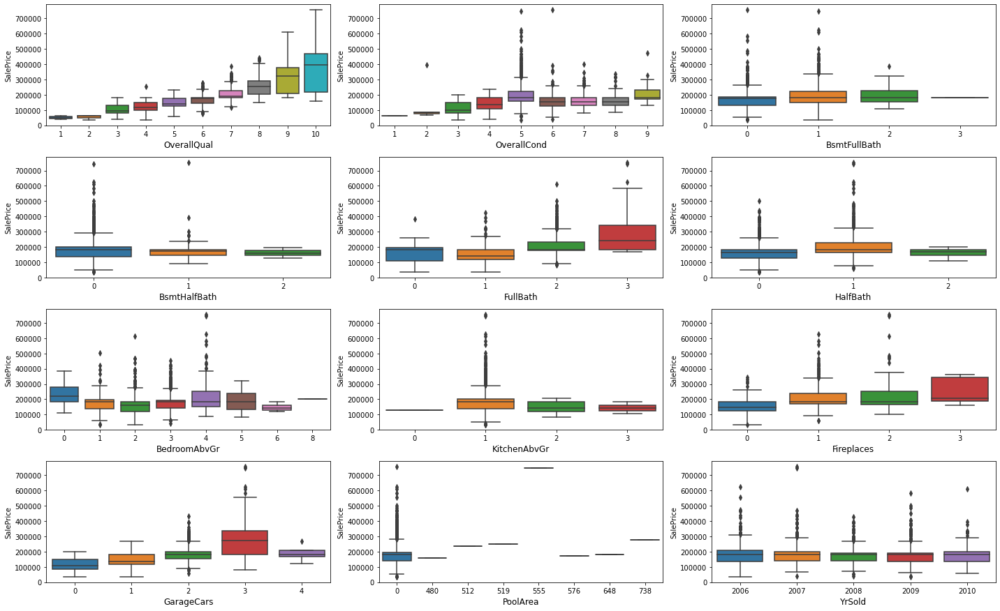

In [27]:
j=0

plt.figure(figsize=(20,30))
for column in df[discretecols]:
    plt.subplot(10,3,j+1)
    sns.boxplot(data=df,x=column, y="SalePrice")
    plt.xlabel(column,fontsize=12)
    j+=1
plt.tight_layout()


- OverallQual and OverallCond
	- as the quality increases the sales price increases


- BsmtFullBath
	- as the no. of full basement bathrooms increases price increases


- BsmtHalfBath
	- as the no, of half bathroom basment increases there is no significant change in price


- FullBath
	- as the no. of full bath above grade increases the price increases
    


- HalfBath
	- houses with 1 half bath has highest sales price


- BedroomAbvGr
	- houses with 0 and 4 bedroom above grade is expensive compared to other


- KitchenAbvGr	
	- houses with 1 kitchen above grade is expensive compared to others


- Fireplaces
	- as the no of fireplaces increases the sales price also increases


- GarageCars
	- as the no of the cars which can be kept in garage increases the sales price increases with exception for 4 cars


- Pool Area
	- most of the houses dont have pools
	- as the pool area increases sales price increases


- YrSold
	- as the years change the sale price is almost constant

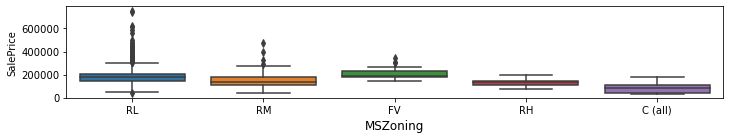

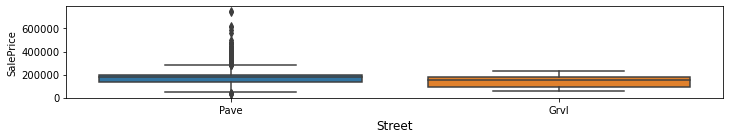

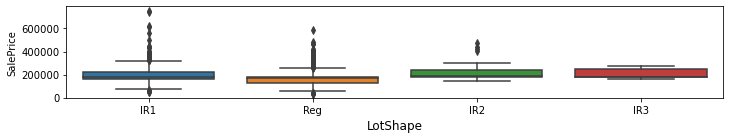

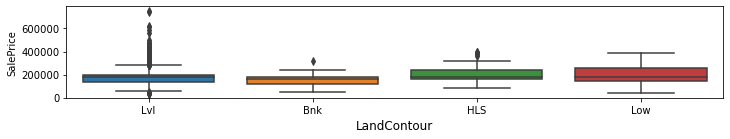

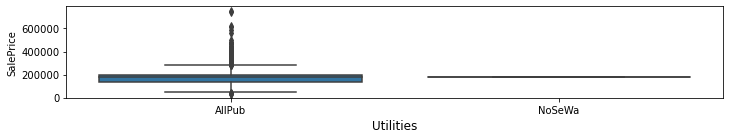

...

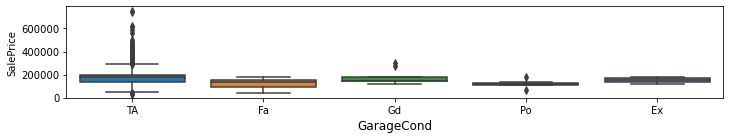

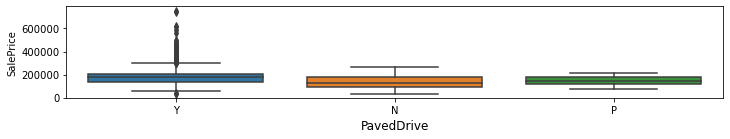

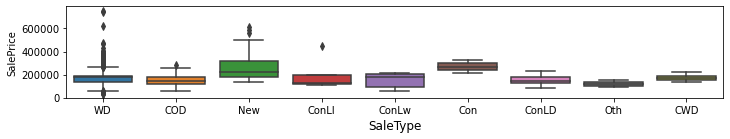

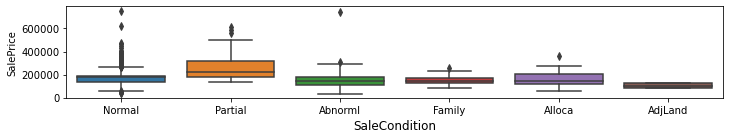

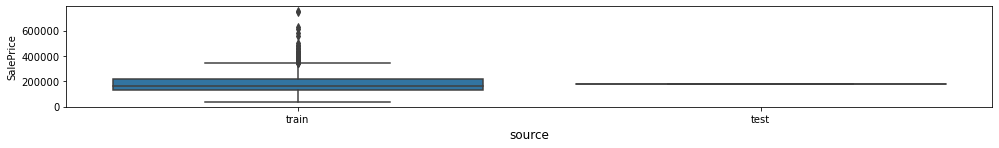

In [28]:
j=0


for column in df[objectColumns]:
    plt.figure(figsize=(40,40))
    plt.subplot(20,3,j+1)
    sns.boxplot(data=df,x=column, y="SalePrice")
    plt.xlabel(column,fontsize=12)
    j+=1
plt.tight_layout()

- MSZoning
	- RL has the highest sales price


- Street
	- Price is higher for houses having ppaved roads


- LotShape
	- IR1 has the highest sales price, followed by IR2


- LandContour
	- Land Contour with low types has the highest sales price


- Utilities
	- houses with all public utilities are expensive


- LotCongif
	- houses having lots in Cul-de-sac configuration is expensive


- Landslope
	- houses with Moderate slopes are expensive 


- Condition1 and condition2
	- Houses with PosA and PosN are expensive


- BldgType
	- houses with Single-family Detached is expensive


- HouseStyle
	- 2Story houses are expensive


- RoofStyle and RoofMatl
	- houses with Hip as roofstyle and WdShngl as materail is expensive


- Exterior1 and Exterior2
	- houses with Cement Board is expensive compare to others


- MasVnrType
	- Stone type masonary vaneer type is expensive


- ExterQal and ExterCond
	- houses with excellent rating is expensive


- Foundation
	- houses with Pconc is expensive


- BsmtQal
	- houses with excellent as basment quality is expensive


- BsmtCond
	- houses with basement condition as Good is expensive


- BsmtFintype1
	- houses with GLQ is expensive 


- BsmtFintype2
	- houses with Unf is expensive

   
- Heating and HeatingQC
	- houses having heating type as GasA and GasW, with heating quality as excellent are expensive


- CentralAir
	- sales price remains the same irrespective of provision for central air conditioning


- Electrical
	- Houses with Sbrkr type of electric systems are expensive


- KitchenQual
	- houses with excellent Kitchen quality is expensive


- Fucntional
	- houses with Typical functionality is expensive


- FireplaceQU
	- houses with excellent rating fireplace are expensive


- GarageType, GarageFinish, GarageQual and Garage Condition
	- houses with builtin garage having its interior finished, with excellent quality and average condition is expensive


- PavedDrive
	- houses with paved drives are expensive


- SaleType
	- Houses which are newly constructed is the most expensive


- SaleCondition
	- houses with sale condition partial is expensive, this is because new sale types houses are expensive
  

#### check skewness

In [29]:
df.skew()[continuecols].sort_values()

GarageYrBlt      -0.668175
YearBuilt        -0.613461
YearRemodAdd     -0.503562
GarageArea        0.179981
MoSold            0.212053
TotRmsAbvGrd      0.676341
2ndFlrSF          0.813030
BsmtUnfSF         0.920268
GrLivArea         1.366560
1stFlrSF          1.376757
MSSubClass        1.407657
TotalBsmtSF       1.524255
WoodDeckSF        1.541376
BsmtFinSF1        1.685503
SalePrice         2.183940
OpenPorchSF       2.364342
LotFrontage       2.384950
MasVnrArea        2.676412
EnclosedPorch     3.089872
ScreenPorch       4.122214
BsmtFinSF2        4.255261
LowQualFinSF      9.011341
3SsnPorch        10.304342
LotArea          12.207688
MiscVal          24.476794
dtype: float64

- skewness is not within limits
- saleprice is not considered as its target variable

#### using power transform to transform the datas

In [30]:
skewed_col=['GarageYrBlt','TotRmsAbvGrd','2ndFlrSF','BsmtUnfSF','GrLivArea','1stFlrSF','MSSubClass','TotalBsmtSF',
            'WoodDeckSF','BsmtFinSF1','OpenPorchSF','LotFrontage','MasVnrArea','EnclosedPorch','ScreenPorch','BsmtFinSF2',
            'LowQualFinSF','3SsnPorch', 'LotArea', 'MiscVal']       
            

In [31]:
#using power transform to transform and normalize the dataset and storing it in A and copying it to df
from sklearn.preprocessing import power_transform
B=df[skewed_col].copy()
A=power_transform(B)
A=pd.DataFrame(A,columns=B.columns)
df[B.columns]=A.copy()
df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,source
0,1.363243,RL,0.086081,-1.173387,Pave,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,-0.827466,TA,TA,CBlock,Gd,TA,No,ALQ,-0.121931,Unf,-0.359384,0.917141,0.106028,GasA,TA,Y,SBrkr,-0.439387,-0.871454,-0.134652,-1.207966,0,0,2,0,2,1,TA,-0.947362,Typ,1,TA,Attchd,-0.234521,RFn,2,440,TA,TA,Y,-0.950337,1.415905,-0.407595,-0.129279,-0.293785,0,-0.192177,2,2007,WD,Normal,128000.000000,train
1,-1.164269,RL,1.159440,1.086704,Pave,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,-0.827466,Gd,Gd,PConc,TA,Gd,Gd,ALQ,0.389438,Rec,2.783698,1.043860,2.398091,GasA,Ex,Y,SBrkr,2.146981,-0.871454,-0.134652,1.308777,1,0,2,0,4,1,Gd,0.946380,Typ,1,TA,Attchd,-0.522120,Unf,2,621,TA,TA,Y,0.803933,1.420557,-0.407595,-0.129279,3.403869,0,-0.192177,10,2007,WD,Normal,268000.000000,train
2,0.493460,RL,1.039598,0.169184,Pave,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,-0.827466,Gd,TA,PConc,Gd,TA,Av,GLQ,0.926686,Unf,-0.359384,-0.520777,0.192669,GasA,Ex,Y,SBrkr,0.074892,1.177232,-0.134652,1.018578,1,0,2,1,3,1,TA,0.946380,Typ,1,TA,Attchd,0.761240,Unf,2,455,TA,TA,Y,1.059652,1.198532,-0.407595,-0.129279,-0.293785,0,-0.192177,6,2007,WD,Normal,269790.000000,train
3,-1.164269,RL,1.544099,0.498627,Pave,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,1.376571,TA,TA,CBlock,Gd,TA,No,BLQ,0.796641,Unf,-0.359384,1.180581,1.691727,GasA,Ex,Y,SBrkr,1.593768,-0.871454,-0.134652,0.755102,0,0,2,0,3,1,TA,0.389921,Typ,1,TA,Attchd,-0.234521,RFn,2,546,TA,TA,Y,-0.950337,1.168365,-0.407595,-0.129279,-0.293785,0,-0.192177,1,2010,COD,Normal,190000.000000,train
4,-1.164269,RL,0.086081,1.180052,Pave,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,1.127130,Gd,TA,CBlock,Gd,TA,No,ALQ,1.181146,Unf,-0.359384,-0.238207,1.213523,GasA,Gd,Y,SBrkr,1.165811,-0.871454,-0.134652,0.332686,0,1,2,0,3,1,Gd,0.946380,Typ,1,TA,Attchd,-0.234521,Fin,2,529,TA,TA,Y,1.148270,-1.071307,-0.407595,-0.129279,-0.293785,0,-0.192177,6,2009,WD,Normal,215000.000000,train
5,0.493460,RL,-0.511062,0.848588,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,-0.827466,Gd,TA,PConc,Gd,TA,Av,Unf,-1.353159,Unf,-0.359384,0.793924,-0.349710,GasA,Ex,Y,SBrkr,-0.714493,1.196999,-0.134652,0.785896,0,0,2,1,4,1,Gd,1.448615,Typ,1,Gd,BuiltIn,1.308245,Fin,3,660,TA,TA,Y,0.872790,0.258843,-0.407595,-0.129279,-0.293785,0,-0.192177,11,2006,New,Partial,219210.000000,train
6,-1.164269,RL,0.086081,0.429412,Pave,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,1.201218,TA,TA,CBlock,Gd,TA,No,ALQ,1.212971,Unf,-0.359384,-1.163286,0.783089,GasA,TA,Y,SBrkr,0.733595,-0.871454,-0.134652,-0.088844,1,0,1,1,3,1,TA,-0.947362,Mod,1,Gd,Detchd,-0.986389,Unf,2,528,TA,TA,Y,-0.950337,-1.071307,-0.407595,-0.129279,3.403821,0,-0.192177,5,2010,WD,Normal,121500.000000,train
7,-1.164269,RL,0.876307,0.714631,Pave,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story

In [32]:
df.skew()[skewed_col].sort_values()

BsmtFinSF1      -0.411401
BsmtUnfSF       -0.274971
GarageYrBlt     -0.133723
OpenPorchSF     -0.014772
1stFlrSF        -0.001106
GrLivArea        0.000171
TotRmsAbvGrd     0.001879
LotArea          0.026569
MSSubClass       0.069019
WoodDeckSF       0.132275
LotFrontage      0.173047
TotalBsmtSF      0.232534
2ndFlrSF         0.280724
MasVnrArea       0.405245
EnclosedPorch    2.047941
BsmtFinSF2       2.425650
ScreenPorch      3.113266
MiscVal          5.016528
LowQualFinSF     7.299413
3SsnPorch        7.613746
dtype: float64

- skewness cant be further treated tried to reduce skew value for EnclosedPorch, BsmtFinSF2, ScreenPorch, MiscVal, LowQualFinSF and 3SsnPorch
- tried to reduce using sqrt, cbrt, log and power transform but there was no reduction in skew value
- as skewness cant be treated the columns whose skew values are not within the limits are dropped

In [33]:
df.drop(['EnclosedPorch', 'BsmtFinSF2', 'ScreenPorch', 'MiscVal', 'LowQualFinSF', '3SsnPorch'],axis=1,inplace=True)

In [34]:
continuecols=[]
numericalCol=df.select_dtypes(include=np.number).columns
for column in numericalCol:
     if df[column].nunique()>10:
        continuecols.append(column)

In [35]:
df.skew()[continuecols].sort_values()

YearBuilt      -0.613461
YearRemodAdd   -0.503562
BsmtFinSF1     -0.411401
BsmtUnfSF      -0.274971
GarageYrBlt    -0.133723
OpenPorchSF    -0.014772
1stFlrSF       -0.001106
GrLivArea       0.000171
TotRmsAbvGrd    0.001879
LotArea         0.026569
MSSubClass      0.069019
WoodDeckSF      0.132275
LotFrontage     0.173047
GarageArea      0.179981
MoSold          0.212053
TotalBsmtSF     0.232534
2ndFlrSF        0.280724
MasVnrArea      0.405245
SalePrice       2.183940
dtype: float64

- skewness is within imits

#### checking correlation

In [36]:
df[continuecols].corr()['SalePrice'].sort_values()

MSSubClass     -0.000710
MoSold          0.064661
2ndFlrSF        0.151339
BsmtUnfSF       0.181699
BsmtFinSF1      0.194953
WoodDeckSF      0.278280
LotFrontage     0.297897
LotArea         0.322795
MasVnrArea      0.334884
OpenPorchSF     0.402824
GarageYrBlt     0.447648
TotRmsAbvGrd    0.455003
YearRemodAdd    0.457254
YearBuilt       0.459183
1stFlrSF        0.511769
TotalBsmtSF     0.526072
GarageArea      0.555317
GrLivArea       0.617915
SalePrice       1.000000
Name: SalePrice, dtype: float64

MSSubClass and MoSold has the least correlation with the target variable

#### plotting heatmap to see the correlation with other features

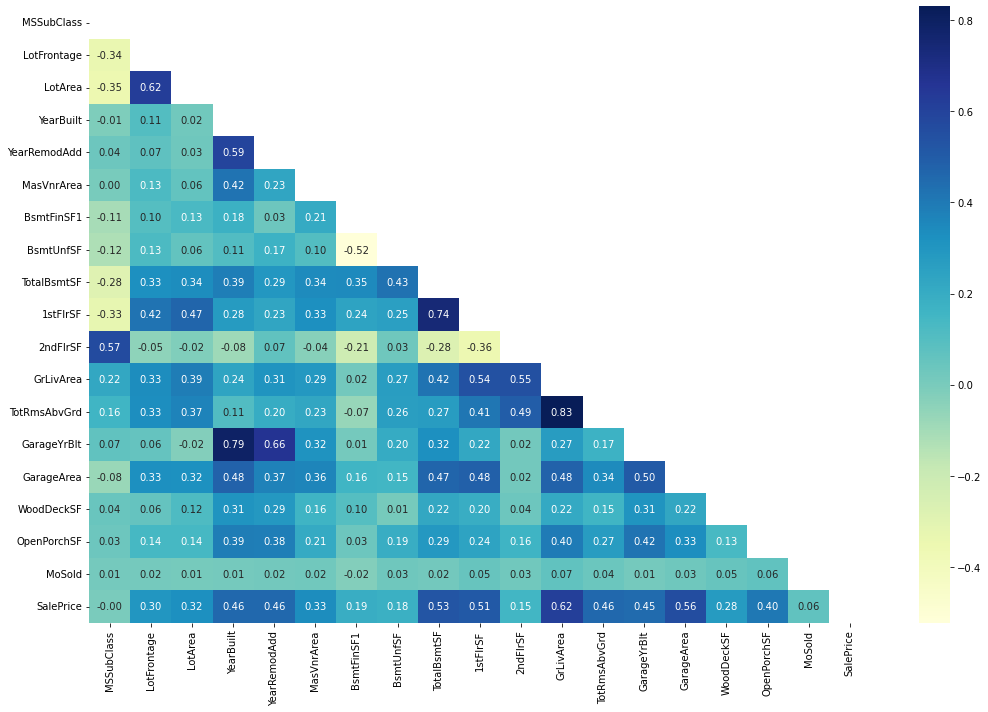

In [37]:
plt.figure(figsize=(15, 10))
mask = np.triu(df[continuecols].corr())
sns.heatmap(df[continuecols].corr(),cmap="YlGnBu",annot = True, fmt = '.2f',mask = mask)
plt.tight_layout()


- Lot area and lot frontage, Year RemodAdd and Year Built, BsmtUnfSF and BsmtFinnSF1, 1stFlrSF and TotalBsmtSF, TotRmsAbvGrd and GrLivArea, GarageYRBLT and YearBuilt, GarageYrBlt and YearRemodAdd have high correlation with each other

- there is chance for multicollinearity

### using vif to check for multicolinearity

In [38]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
k=df[continuecols].copy()
t=k.drop(['SalePrice'],axis=1).copy()
d=sc.fit_transform(t)
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(d, i)for i in range(len(t.columns))]
vif['features']=t.columns
vif.sort_values(by='vif',ascending=False)

,vif,features
11,19.336669,GrLivArea
9,12.917270,1stFlrSF
10,12.891235,2ndFlrSF
8,5.067959,TotalBsmtSF
7,3.627143,BsmtUnfSF
13,3.627102,GarageYrBlt
12,3.546514,TotRmsAbvGrd
3,3.269838,YearBuilt
6,3.247712,BsmtFinSF1
2,2.106781,LotArea


#### dropping GrLivArea

In [39]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
k=df[continuecols].copy()
t=k.drop(['SalePrice','GrLivArea'],axis=1).copy()
d=sc.fit_transform(t)
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(d, i)for i in range(len(t.columns))]
vif['features']=t.columns
vif.sort_values(by='vif',ascending=False)

,vif,features
8,5.033270,TotalBsmtSF
9,4.449847,1stFlrSF
12,3.625526,GarageYrBlt
7,3.624712,BsmtUnfSF
10,3.618687,2ndFlrSF
3,3.246754,YearBuilt
6,3.243541,BsmtFinSF1
11,3.010284,TotRmsAbvGrd
2,2.105981,LotArea
0,1.940050,MSSubClass


vif is within limits less than 10 

#### dropping GrLivArea

In [40]:
df.drop(['GrLivArea'],axis=1,inplace=True)

In [41]:
continuecols=['MSSubClass', 'LotFrontage','LotArea','YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 
'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'TotRmsAbvGrd', 'GarageYrBlt', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold',
'SalePrice']

#### Encoding

In [42]:
from sklearn.preprocessing import OrdinalEncoder

In [43]:
#Replacing ratings with suitable numbers
column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in column:
    df[i] = df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [44]:
#Ordinal encoding for train dataset

OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=OE.fit_transform(df[i].values.reshape(-1,1))

#### splitting back to test and train dataset

In [45]:
#Lets seprate the train and test
df_train=df.loc[df["source"]==1]
df_test=df.loc[df["source"]==0]
df_test.reset_index(drop=True,inplace=True)

In [46]:
df_train.drop(columns=['source'],inplace=True)
df_test.drop(columns=['source'],inplace=True)

#### Outliers check

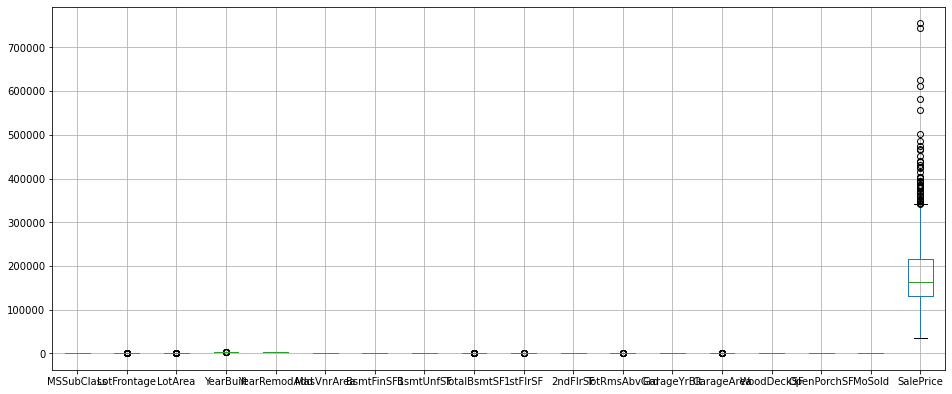

In [47]:
# visualizing
df_train[continuecols].iloc[:,:].boxplot(figsize = (16,8))
plt.subplots_adjust(bottom=0.25)
plt.show()

presence of outliers

#### using z score for treating

In [48]:
from scipy.stats import zscore
z=np.abs(zscore(df_train[continuecols]))
df_x=df_train[(z<3).all(axis=1)]
data_loss=((df_train.shape[0]-df_x.shape[0])/df.shape[0])*100
print("data loss ", data_loss, " %")

data loss  6.438356164383562  %


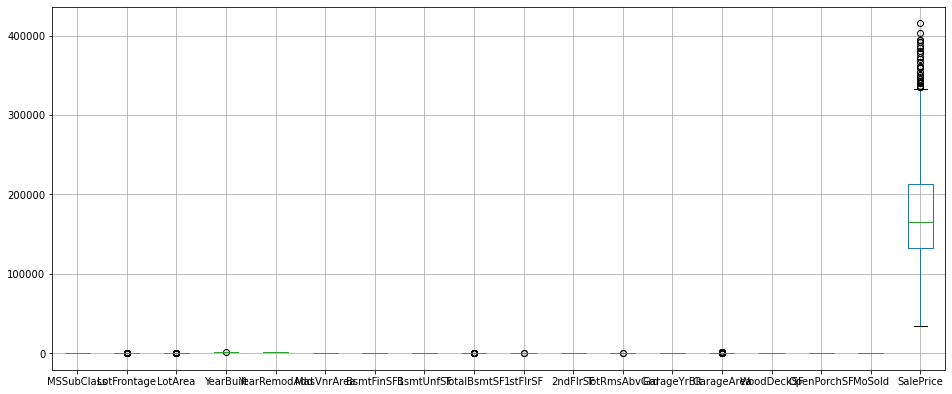

In [49]:
# visualizing
df_x[continuecols].iloc[:,:].boxplot(figsize = (16,8))
plt.subplots_adjust(bottom=0.25)
plt.show()

#### Splitting dataset

In [51]:
X=df_x.drop(columns=["SalePrice"])
Y=df_x[["SalePrice"]]

#### Running Algorithm

In [52]:
#importing necessary librairies 
#A=[] // stores test accuracy
#B=[] // stores cv_mean 
#C=[] // stores mean_squared_error
#D=[] // min diff between test accuracy and cv_score
#mae=[] // stores mean_absolute_error

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
A=[] 
B=[] 
C=[] 
D=[] 
mae=[] 

In [53]:
#importing necessary librairies 
#A=[] // stores test accuracy
#B=[] // stores cv_mean 
#C=[] // stores mean_squared_error
#D=[] // min diff between test accuracy and cv_score
#mae=[] // stores mean_absolute_error

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
A=[] 
B=[] 
C=[] 
D=[] 
mae=[] 
#loop used to find the best random state
def maxr2_score(regr,X,Y):
    max_r_score=0
    for r_state in range(0,100):
        x_train, x_test, y_train, y_test = train_test_split(X, Y,random_state = r_state,test_size=0.20)
        regr.fit(x_train,y_train)
        y_pred = regr.predict(x_test)
        r2_scr=(r2_score(y_test,y_pred))*100
        print("r2 score corresponding to ",r_state," is ",r2_scr)
        if r2_scr>max_r_score:
            max_r_score=r2_scr
            final_r_state=r_state
    print("max r2 score corresponding to ",final_r_state," is ",max_r_score)
    return final_r_state

In [54]:
# used to get test accuracy, train accuracy, mse, mae
def te_t(regr,x_train,x_test,y_train,y_test,R):
    regr.fit(x_train,y_train)
    y_tr=regr.predict(x_train)
    y_te=regr.predict(x_test)
    print(f"test accuracy is {round(r2_score(y_test,y_te)*100,1)}")
    A.append(round(r2_score(y_test,y_te)*100,1))
    print(f"train accuracy is {round(r2_score(y_train,y_tr)*100,1)}")
    C.append(mean_squared_error(y_test,y_te))
    mae.append(mean_absolute_error(y_test,y_te))

In [55]:
# used to find the best cv_score
def score(regr,x_train,x_test,y_train,y_test,R):
    max_cv_mean=0
    min_dif=100
    r=0
    k=0
    y_tr=regr.predict(x_train)
    y_te=regr.predict(x_test)
    t_ac=round(r2_score(y_train,y_tr)*100,1)
    te_ac=round(r2_score(y_test,y_te)*100,1)
    for j in range(2,20):
        cv_score=cross_val_score(regr,X,Y,cv=j)
        cv_mean=cv_score.mean()*100
        d=np.abs(cv_mean-te_ac)
        print(f"At cv is {j} cv score is {round(cv_mean,2)}  \n test accuracy is {te_ac} \n")
        if cv_mean>max_cv_mean:
            max_cv_mean=cv_mean
            k=j
        if d<min_dif:
            min_dif=d
            r=j
    B.append(max_cv_mean) 
    print("min diff between test accuracy and cv score ",min_dif," at ", r," max cv ",max_cv_mean," at ",k)
    D.append(min_dif)

In [56]:
from sklearn.tree import DecisionTreeRegressor
reg= DecisionTreeRegressor()
R=maxr2_score(reg,X,Y)

r2 score corresponding to  0  is  76.14613141699378
r2 score corresponding to  1  is  71.39420990889266
r2 score corresponding to  2  is  66.47160721796412
r2 score corresponding to  3  is  76.2772729448319
r2 score corresponding to  4  is  68.28950843915653
r2 score corresponding to  5  is  68.09653438562681
r2 score corresponding to  6  is  64.0355046654553
r2 score corresponding to  7  is  75.24877700873841
r2 score corresponding to  8  is  69.13575240941373
r2 score corresponding to  9  is  59.6254943264954
r2 score corresponding to  10  is  48.33700998956181
r2 score corresponding to  11  is  67.64794161648754
r2 score corresponding to  12  is  72.60036509809554
r2 score corresponding to  13  is  76.64478692846353
r2 score corresponding to  14  is  74.77638647581024
r2 score corresponding to  15  is  75.13631927295468
r2 score corresponding to  16  is  69.54768387762033
r2 score corresponding to  17  is  68.03704799848582
r2 score corresponding to  18  is  66.90465179376291
r2 sco

In [57]:
x1_train,x1_test,y1_train,y1_test=train_test_split(X,Y,random_state=R,test_size=0.2)
te_t(reg,x1_train,x1_test,y1_train,y1_test,R)
print('\n')
score(reg,x1_train,x1_test,y1_train,y1_test,R)

test accuracy is 78.5
train accuracy is 100.0


At cv is 2 cv score is 65.86  
 test accuracy is 78.5 

At cv is 3 cv score is 65.97  
 test accuracy is 78.5 

At cv is 4 cv score is 71.06  
 test accuracy is 78.5 

At cv is 5 cv score is 68.81  
 test accuracy is 78.5 

At cv is 6 cv score is 68.93  
 test accuracy is 78.5 

At cv is 7 cv score is 70.07  
 test accuracy is 78.5 

At cv is 8 cv score is 70.55  
 test accuracy is 78.5 

At cv is 9 cv score is 68.8  
 test accuracy is 78.5 

At cv is 10 cv score is 67.14  
 test accuracy is 78.5 

At cv is 11 cv score is 69.7  
 test accuracy is 78.5 

At cv is 12 cv score is 69.44  
 test accuracy is 78.5 

At cv is 13 cv score is 68.9  
 test accuracy is 78.5 

At cv is 14 cv score is 71.27  
 test accuracy is 78.5 

At cv is 15 cv score is 69.84  
 test accuracy is 78.5 

At cv is 16 cv score is 70.97  
 test accuracy is 78.5 

At cv is 17 cv score is 69.98  
 test accuracy is 78.5 

At cv is 18 cv score is 67.54  
 test accuracy is 7

In [58]:
from sklearn.ensemble import RandomForestRegressor
rf_reg= RandomForestRegressor()
R=maxr2_score(rf_reg,X,Y)

r2 score corresponding to  0  is  87.15100124511666
r2 score corresponding to  1  is  85.16941158274194
r2 score corresponding to  2  is  82.3806373074064
r2 score corresponding to  3  is  89.31668777172105
r2 score corresponding to  4  is  82.57545438694069
r2 score corresponding to  5  is  87.9804698920328
r2 score corresponding to  6  is  84.27244899944193
r2 score corresponding to  7  is  87.30888024664834
r2 score corresponding to  8  is  84.66896201622505
r2 score corresponding to  9  is  84.94525844148917
r2 score corresponding to  10  is  82.65652789267078
r2 score corresponding to  11  is  85.97625757370481
r2 score corresponding to  12  is  87.02262610832354
r2 score corresponding to  13  is  84.81508235011788
r2 score corresponding to  14  is  87.35068025921312
r2 score corresponding to  15  is  85.3463567612577
r2 score corresponding to  16  is  86.86731108962869
r2 score corresponding to  17  is  87.2988284776601
r2 score corresponding to  18  is  86.71539164014037
r2 scor

In [59]:
x2_train,x2_test,y2_train,y2_test=train_test_split(X,Y,random_state=R,test_size=0.2)
te_t(rf_reg,x2_train,x2_test,y2_train,y2_test,R)
print('\n')
score(rf_reg,x2_train,x2_test,y2_train,y2_test,R)

test accuracy is 89.1
train accuracy is 97.9


At cv is 2 cv score is 84.36  
 test accuracy is 89.1 

At cv is 3 cv score is 85.2  
 test accuracy is 89.1 

At cv is 4 cv score is 86.24  
 test accuracy is 89.1 

At cv is 5 cv score is 86.19  
 test accuracy is 89.1 

At cv is 6 cv score is 86.2  
 test accuracy is 89.1 

At cv is 7 cv score is 86.18  
 test accuracy is 89.1 

At cv is 8 cv score is 86.45  
 test accuracy is 89.1 

At cv is 9 cv score is 86.52  
 test accuracy is 89.1 

At cv is 10 cv score is 86.45  
 test accuracy is 89.1 

At cv is 11 cv score is 86.4  
 test accuracy is 89.1 

At cv is 12 cv score is 86.26  
 test accuracy is 89.1 

At cv is 13 cv score is 86.32  
 test accuracy is 89.1 

At cv is 14 cv score is 86.37  
 test accuracy is 89.1 

At cv is 15 cv score is 86.4  
 test accuracy is 89.1 

At cv is 16 cv score is 86.33  
 test accuracy is 89.1 

At cv is 17 cv score is 86.72  
 test accuracy is 89.1 

At cv is 18 cv score is 86.24  
 test accuracy is 89.

In [60]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
knr = KNeighborsRegressor()
R=maxr2_score(knr,X,Y)

r2 score corresponding to  0  is  62.63299462815699
r2 score corresponding to  1  is  49.64003284090589
r2 score corresponding to  2  is  49.562522795734495
r2 score corresponding to  3  is  64.37053330803133
r2 score corresponding to  4  is  53.09006482515593
r2 score corresponding to  5  is  63.32694577003502
r2 score corresponding to  6  is  49.9628019657133
r2 score corresponding to  7  is  59.07827470901496
r2 score corresponding to  8  is  47.85672352502668
r2 score corresponding to  9  is  62.34051476013386
r2 score corresponding to  10  is  52.107199910419766
r2 score corresponding to  11  is  64.33231603165288
r2 score corresponding to  12  is  56.485881037990836
r2 score corresponding to  13  is  51.82945960808305
r2 score corresponding to  14  is  48.40760949087911
r2 score corresponding to  15  is  63.32924442516119
r2 score corresponding to  16  is  57.068432263820014
r2 score corresponding to  17  is  61.86646739343078
r2 score corresponding to  18  is  61.83217307926904


In [61]:
x3_train,x3_test,y3_train,y3_test=train_test_split(X,Y,random_state=R,test_size=0.2)
te_t(knr,x3_train,x3_test,y3_train,y3_test,R)
print('\n')
score(knr,x3_train,x3_test,y3_train,y3_test,R)

test accuracy is 66.0
train accuracy is 68.9


At cv is 2 cv score is 53.62  
 test accuracy is 66.0 

At cv is 3 cv score is 53.94  
 test accuracy is 66.0 

At cv is 4 cv score is 54.88  
 test accuracy is 66.0 

At cv is 5 cv score is 55.18  
 test accuracy is 66.0 

At cv is 6 cv score is 54.75  
 test accuracy is 66.0 

At cv is 7 cv score is 55.11  
 test accuracy is 66.0 

At cv is 8 cv score is 54.81  
 test accuracy is 66.0 

At cv is 9 cv score is 54.77  
 test accuracy is 66.0 

At cv is 10 cv score is 55.21  
 test accuracy is 66.0 

At cv is 11 cv score is 55.29  
 test accuracy is 66.0 

At cv is 12 cv score is 54.39  
 test accuracy is 66.0 

At cv is 13 cv score is 55.12  
 test accuracy is 66.0 

At cv is 14 cv score is 54.79  
 test accuracy is 66.0 

At cv is 15 cv score is 55.66  
 test accuracy is 66.0 

At cv is 16 cv score is 55.82  
 test accuracy is 66.0 

At cv is 17 cv score is 55.54  
 test accuracy is 66.0 

At cv is 18 cv score is 54.34  
 test accuracy is

In [62]:
from sklearn.linear_model import LinearRegression
lnr=LinearRegression()
R=maxr2_score(lnr,X,Y)

r2 score corresponding to  0  is  85.51491486275008
r2 score corresponding to  1  is  87.19158564049532
r2 score corresponding to  2  is  81.26412496572814
r2 score corresponding to  3  is  86.34046869166208
r2 score corresponding to  4  is  84.888476734672
r2 score corresponding to  5  is  85.58390466464859
r2 score corresponding to  6  is  84.54339553104317
r2 score corresponding to  7  is  84.18297643571695
r2 score corresponding to  8  is  85.65875310585993
r2 score corresponding to  9  is  84.76752706153466
r2 score corresponding to  10  is  80.9183695774463
r2 score corresponding to  11  is  84.31970208994248
r2 score corresponding to  12  is  84.85525274380572
r2 score corresponding to  13  is  87.28933579276578
r2 score corresponding to  14  is  88.31220814469542
r2 score corresponding to  15  is  84.92189653647098
r2 score corresponding to  16  is  87.64334964296542
r2 score corresponding to  17  is  85.88712577640476
r2 score corresponding to  18  is  88.50331615660129
r2 sco

In [63]:
x4_train,x4_test,y4_train,y4_test=train_test_split(X,Y,random_state=R,test_size=0.2)
te_t(lnr,x4_train,x4_test,y4_train,y4_test,R)
print('\n')
score(lnr,x4_train,x4_test,y4_train,y4_test,R)

test accuracy is 89.8
train accuracy is 87.4


At cv is 2 cv score is 84.0  
 test accuracy is 89.8 

At cv is 3 cv score is 85.22  
 test accuracy is 89.8 

At cv is 4 cv score is 85.71  
 test accuracy is 89.8 

At cv is 5 cv score is 85.45  
 test accuracy is 89.8 

At cv is 6 cv score is 85.62  
 test accuracy is 89.8 

At cv is 7 cv score is 85.81  
 test accuracy is 89.8 

At cv is 8 cv score is 85.88  
 test accuracy is 89.8 

At cv is 9 cv score is 85.75  
 test accuracy is 89.8 

At cv is 10 cv score is 85.65  
 test accuracy is 89.8 

At cv is 11 cv score is 85.78  
 test accuracy is 89.8 

At cv is 12 cv score is 85.46  
 test accuracy is 89.8 

At cv is 13 cv score is 85.78  
 test accuracy is 89.8 

At cv is 14 cv score is 85.4  
 test accuracy is 89.8 

At cv is 15 cv score is 85.58  
 test accuracy is 89.8 

At cv is 16 cv score is 85.67  
 test accuracy is 89.8 

At cv is 17 cv score is 85.72  
 test accuracy is 89.8 

At cv is 18 cv score is 85.39  
 test accuracy is 8

In [64]:
from sklearn.ensemble import AdaBoostRegressor
adboost_reg= AdaBoostRegressor()
R=maxr2_score(adboost_reg,X,Y)

r2 score corresponding to  0  is  83.12142194696146
r2 score corresponding to  1  is  79.24977974280303
r2 score corresponding to  2  is  78.54501795886091
r2 score corresponding to  3  is  84.37649548455897
r2 score corresponding to  4  is  77.96330652714374
r2 score corresponding to  5  is  83.53001082428318
r2 score corresponding to  6  is  79.9567191544587
r2 score corresponding to  7  is  83.16480923990038
r2 score corresponding to  8  is  81.10548080438498
r2 score corresponding to  9  is  80.19415952153406
r2 score corresponding to  10  is  74.25639337976045
r2 score corresponding to  11  is  82.60414854671151
r2 score corresponding to  12  is  83.67467022312924
r2 score corresponding to  13  is  77.39282258756927
r2 score corresponding to  14  is  84.49492083399545
r2 score corresponding to  15  is  81.81661052892214
r2 score corresponding to  16  is  82.13847432078046
r2 score corresponding to  17  is  84.82974131304289
r2 score corresponding to  18  is  83.52440433683613
r2 s

In [65]:
x5_train,x5_test,y5_train,y5_test=train_test_split(X,Y,random_state=R,test_size=0.2)
te_t(adboost_reg,x5_train,x5_test,y5_train,y5_test,R)
print('\n')
score(adboost_reg,x5_train,x5_test,y5_train,y5_test,R)

test accuracy is 85.8
train accuracy is 87.4


At cv is 2 cv score is 81.71  
 test accuracy is 85.8 

At cv is 3 cv score is 81.74  
 test accuracy is 85.8 

At cv is 4 cv score is 82.42  
 test accuracy is 85.8 

At cv is 5 cv score is 81.02  
 test accuracy is 85.8 

At cv is 6 cv score is 81.4  
 test accuracy is 85.8 

At cv is 7 cv score is 80.89  
 test accuracy is 85.8 

At cv is 8 cv score is 81.51  
 test accuracy is 85.8 

At cv is 9 cv score is 81.44  
 test accuracy is 85.8 

At cv is 10 cv score is 81.47  
 test accuracy is 85.8 

At cv is 11 cv score is 81.09  
 test accuracy is 85.8 

At cv is 12 cv score is 80.54  
 test accuracy is 85.8 

At cv is 13 cv score is 81.88  
 test accuracy is 85.8 

At cv is 14 cv score is 81.14  
 test accuracy is 85.8 

At cv is 15 cv score is 81.49  
 test accuracy is 85.8 

At cv is 16 cv score is 81.28  
 test accuracy is 85.8 

At cv is 17 cv score is 81.86  
 test accuracy is 85.8 

At cv is 18 cv score is 81.02  
 test accuracy is 

In [66]:
from sklearn.ensemble import GradientBoostingRegressor
grad_reg=GradientBoostingRegressor()
R=maxr2_score(grad_reg,X,Y)

r2 score corresponding to  0  is  88.38790216530687
r2 score corresponding to  1  is  89.11109660841218
r2 score corresponding to  2  is  84.99295686861589
r2 score corresponding to  3  is  91.07706431674407
r2 score corresponding to  4  is  84.4867996010969
r2 score corresponding to  5  is  90.09698358121622
r2 score corresponding to  6  is  86.48628779225828
r2 score corresponding to  7  is  88.25864389524651
r2 score corresponding to  8  is  86.6684233873999
r2 score corresponding to  9  is  88.40820388628113
r2 score corresponding to  10  is  83.24557686904663
r2 score corresponding to  11  is  88.33171646643274
r2 score corresponding to  12  is  88.13522391483924
r2 score corresponding to  13  is  88.1191227300213
r2 score corresponding to  14  is  90.09426114669814
r2 score corresponding to  15  is  89.04315148123662
r2 score corresponding to  16  is  88.63410450387667
r2 score corresponding to  17  is  87.50996206971548
r2 score corresponding to  18  is  88.65183586541318
r2 sco

In [67]:
x6_train,x6_test,y6_train,y6_test=train_test_split(X,Y,random_state=R,test_size=0.2)
te_t(grad_reg,x6_train,x6_test,y6_train,y6_test,R)
print('\n')
score(grad_reg,x6_train,x6_test,y6_train,y6_test,R)

test accuracy is 91.6
train accuracy is 95.9


At cv is 2 cv score is 86.68  
 test accuracy is 91.6 

At cv is 3 cv score is 87.43  
 test accuracy is 91.6 

At cv is 4 cv score is 87.82  
 test accuracy is 91.6 

At cv is 5 cv score is 87.45  
 test accuracy is 91.6 

At cv is 6 cv score is 87.64  
 test accuracy is 91.6 

At cv is 7 cv score is 87.54  
 test accuracy is 91.6 

At cv is 8 cv score is 87.95  
 test accuracy is 91.6 

At cv is 9 cv score is 87.7  
 test accuracy is 91.6 

At cv is 10 cv score is 87.98  
 test accuracy is 91.6 

At cv is 11 cv score is 87.75  
 test accuracy is 91.6 

At cv is 12 cv score is 87.85  
 test accuracy is 91.6 

At cv is 13 cv score is 87.83  
 test accuracy is 91.6 

At cv is 14 cv score is 87.49  
 test accuracy is 91.6 

At cv is 15 cv score is 87.68  
 test accuracy is 91.6 

At cv is 16 cv score is 88.0  
 test accuracy is 91.6 

At cv is 17 cv score is 87.67  
 test accuracy is 91.6 

At cv is 18 cv score is 87.81  
 test accuracy is 9

#### Creating Table to view data

In [68]:
L=['DT','RF','KNN','LR','ADA','GRAD']

In [69]:
E=pd.DataFrame({'test accuracy':A,'cv_score': B,'diff':D,'mse':C,'mae':mae},index=L)
E.sort_values(by=['diff','test accuracy', 'mse', 'mae' ])

,test accuracy,cv_score,diff,mse,mae
RF,89.1,86.719257,2.380743,4.774785e+08,16054.589535
ADA,85.8,82.419272,3.380728,5.836482e+08,17593.574386
GRAD,91.6,88.002578,3.597422,4.012385e+08,15198.095431
LR,89.8,85.876309,3.923691,4.386685e+08,15622.897443
DT,78.5,71.270853,7.229147,1.006099e+09,22690.972093
KNN,66.0,55.824896,10.175104,1.406998e+09,28005.814884


#### Infernce
- Random forest is the best model
    - least differnce between test accuracy and cv_score
    - second highest test accuracy and cv_score
    - least error

#### Hyper paramter tuning

In [70]:
from sklearn.model_selection import GridSearchCV

In [86]:
par={'n_estimators': [150,200,250,275], 
     'max_features': ['log2', 'sqrt','auto'],
     'criterion': ["squared_error", "friedman_mse", "absolute_error","poisson"],
     'max_depth': [75,100,125],
     'min_samples_split':[2, 3, 4]
}

In [87]:
grid=GridSearchCV( rf_reg,par,cv=2)
grid.fit(x2_train,y2_train)
grid.best_params_ 

{'criterion': 'friedman_mse',
 'max_depth': 100,
 'max_features': 'sqrt',
 'min_samples_split': 2,
 'n_estimators': 200}

In [88]:
rf_reg=RandomForestRegressor( criterion= 'friedman_mse', max_depth= 100, max_features= 'sqrt',min_samples_split=2,n_estimators= 200)
rf_reg.fit(x2_train,y2_train)
y_te=rf_reg.predict(x2_test)
r2=round(r2_score(y2_test,y_te)*100,2)
r2

89.62

In [89]:
cv_score=cross_val_score(rf_reg,X,Y,cv=17)
cv_mean=round(cv_score.mean()*100,2)
print(cv_mean)

86.6


- test accuracy and cv_score increased

#### Storing model and loading it

In [115]:
import pickle
filename='Housing_price_prediction.pkl'
pickle.dump(rf_reg,open(filename,'wb'))

In [116]:
l_m=pickle.load(open('Housing_price_prediction.pkl','rb'))

In [117]:
X=pd.DataFrame(X,columns=df_test.columns)


In [118]:
X=X.drop(columns=["SalePrice"])

In [119]:
y_pred = l_m.predict(X)
y_pred

array([134546.525, 245916.12 , 250824.03 , ..., 149091.435, 102679.605,
       185317.81 ])

In [120]:
#Making dataframe for predicted SalePrice
House_Price_Predictions=pd.DataFrame({'predicted_SalePrice':y_pred})
House_Price_Predictions

,predicted_SalePrice
0,134546.525
1,245916.120
2,250824.030
3,205021.825
4,231438.860
5,221163.165
6,135696.495
7,179546.480
8,138129.045
9,119063.715
